**Import Library**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as implt
import seaborn as sns
import plotly.express as px

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization,GlobalAveragePooling2D
from tensorflow.keras.callbacks import Callback, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.initializers import GlorotNormal
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.models import load_model


from keras.models import load_model
from keras.preprocessing.image import load_img, img_to_array
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.applications.resnet import ResNet101
from tensorflow.keras.applications import ResNet50
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import EfficientNetV2L

from PIL import Image
import shutil

import random
import os
import warnings
import glob
import re
import zipfile

# **1. LOADING DATASET FROM GDRIVE**

**Mounting Google Drive in Google Colab**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **2. INSPECT DATASET**

**Listing and Sorting Folders in a Dataset Directory**

In [ ]:
path = '/content/drive/MyDrive/DATASET'
folders = sorted(os.listdir(path))
print(folders)

catagories = folders

['Corn', 'Papaya', 'Potato', 'Tomato']


The output lists four crop categories - Corn, Papaya, Potato, and Tomato - indicating that the dataset is organized by crop type.






**Collecting Disease Count Data for Plants**

In [ ]:
subfolders = []
for folder in folders:
    subfolders.append(os.listdir(os.path.join(path, folder)))

data = []
for i in range(len(folders)):
    for j in range(len(subfolders[i])):
        count = len(os.listdir(os.path.join(path, folders[i], subfolders[i][j])))
        data.append({'Plant': folders[i], 'Disease': subfolders[i][j], 'Count': count})

df = pd.DataFrame(data)
pd.set_option('display.max_rows', None)

print(df)

     Plant                 Disease  Count
0     Corn                  blight    400
1     Corn             common_rust    400
2     Corn          gray_leaf_spot    400
3     Corn                 healthy    400
4   Papaya           BacterialSpot    458
5   Papaya                    Curl    585
6   Papaya                RingSpot    533
7   Potato       alternaria_solani    400
8   Potato                 healthy    400
9   Potato                  insect    302
10  Potato   phytopthora_infestans    400
11  Potato                   virus    400
12  Tomato      septoria_leaf_spot    454
13  Tomato             late_blight    444
14  Tomato  yellow_leaf_curl_virus    444
15  Tomato                 healthy    444


It can be seen that the disease data distribution is uneven, with some having too few and others having too many.

**Filtering and Counting Plant Diseases with Image Count Below 400**

In [ ]:
print(df[df['Count'] < 400])

    Plant Disease  Count
9  Potato  insect    302


The output shows that the Potato - Insect disease category has only 302 images which is less than the 400-image threshold. This indicates a class imbalance in the dataset, which may require data augmentation or re-sampling to improve model performance.

In [ ]:
count_less_than_400 = len(df[df['Count'] < 400])
print(f"Number of diseases with less than 400 images: {count_less_than_400}")

Number of diseases with less than 400 images: 1


There is 1 disease category with fewer than 400 images.

**Visualizing Disease Case Counts for Each Plant Using Bar Charts**

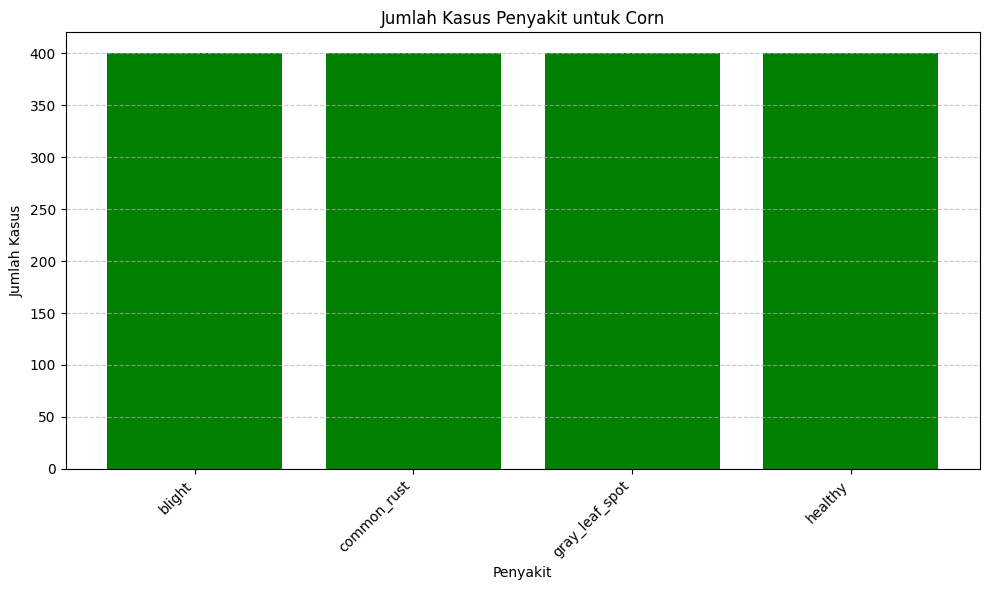

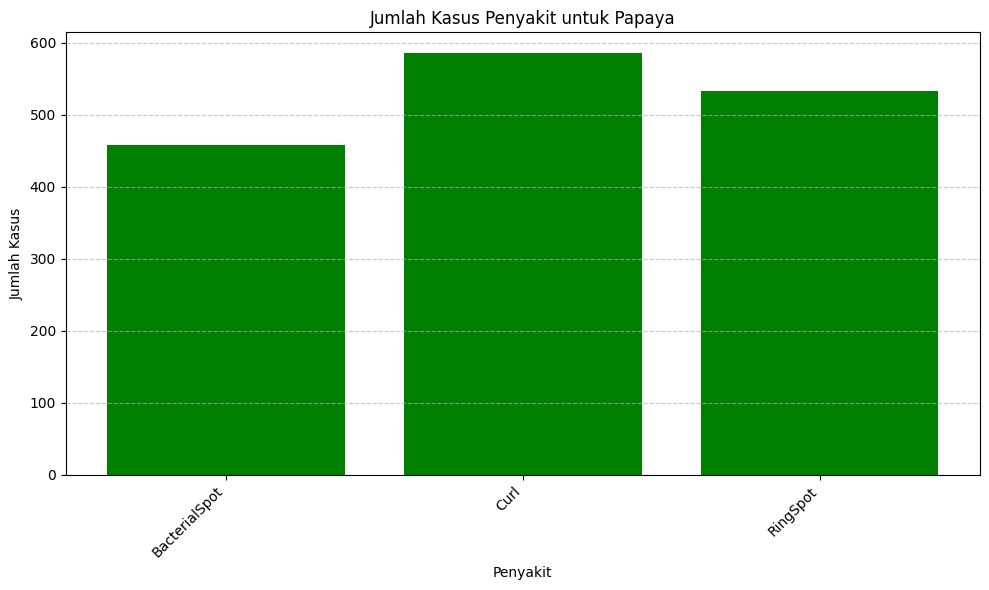

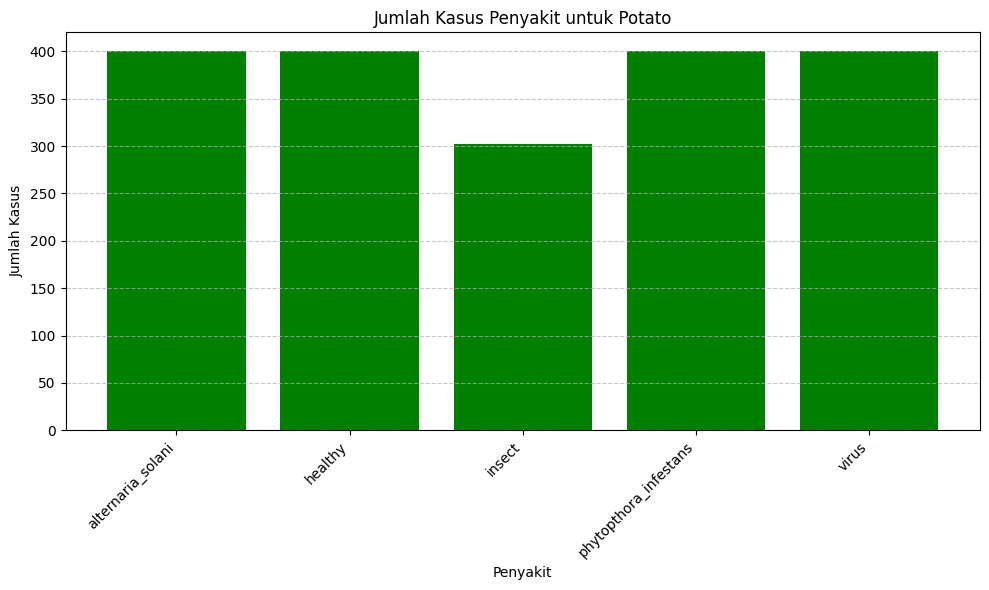

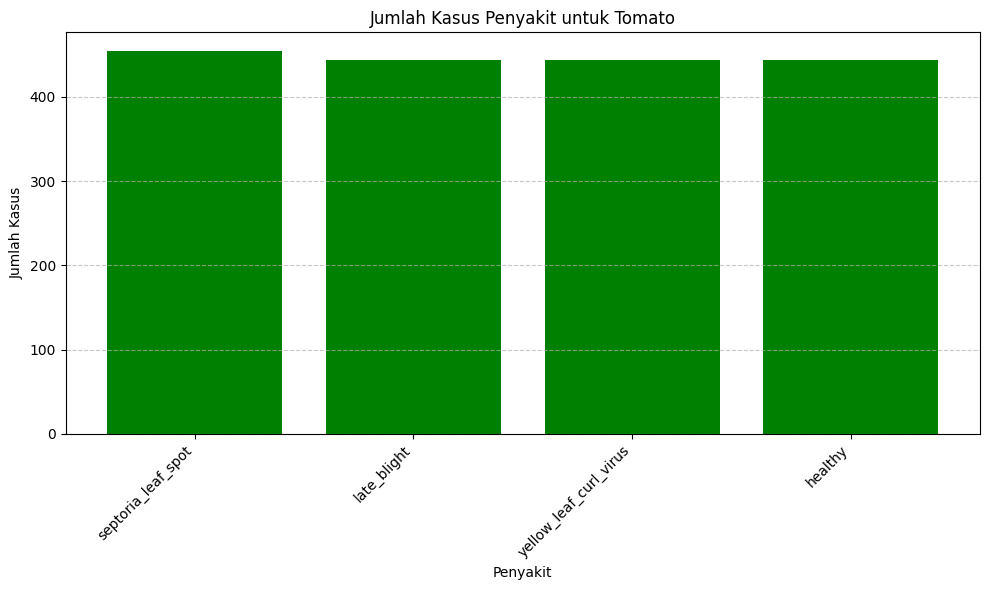

In [ ]:
df = pd.DataFrame(data)

plants = df['Plant'].unique()

for plant in plants:
    plant_data = df[df['Plant'] == plant]
    plt.figure(figsize=(10, 6))
    plt.bar(plant_data['Disease'], plant_data['Count'], color='green')
    plt.title(f'Total Disease Cases for {plant}')
    plt.xlabel('Disease')
    plt.ylabel('Total number of cases')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

The bar chart visualizes the number of disease cases for each crop. This helps identify the disease of each plant, providing insight into the class distribution and potential imbalances in the data.

In [ ]:
fig = px.treemap(df, path=['Plant', 'Disease'], values='Count', title='Plant and Disease Distribution')
fig.show()

**Calculating Disease Counts and Percentages with DataFrame Aggregation**

In [ ]:
disease_counts = df.groupby('Disease')['Count'].sum()
disease_percentages = (disease_counts / disease_counts.sum()) * 100
disease_balance = pd.DataFrame({'Count': disease_counts, 'Percentage': disease_percentages})
disease_balance = disease_balance.sort_values('Count', ascending=False)

disease_balance

,Count,Percentage
Disease,,
healthy,1244,18.123543
Curl,585,8.522727
RingSpot,533,7.765152
BacterialSpot,458,6.672494
septoria_leaf_spot,454,6.614219
yellow_leaf_curl_virus,444,6.468531
late_blight,444,6.468531
common_rust,400,5.827506
alternaria_solani,400,5.827506


The distribution of diseases in the dataset is uneven, which can be seen through the calculation of the total number and percentage of images for each disease.

**Descriptive Statistics of the Dataset**

In [ ]:
df.describe()

,Count
count,16.000000
mean,429.000000
std,63.324561
min,302.000000
25%,400.000000
50%,400.000000
75%,446.500000
max,585.000000


#**3. DATA CLEANING**

**Reducing and Copying Plant Disease Images to a Target Directory**

In [ ]:
def reduce_and_copy_images(source_dir, target_dir, max_images, min_images):
    if not os.path.exists(target_dir):
        os.makedirs(target_dir)
    for plant in os.listdir(source_dir):
        plant_path = os.path.join(source_dir, plant)
        if os.path.isdir(plant_path):
            for disease in os.listdir(plant_path):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    files = os.listdir(disease_path)
                    if len(files) < min_images:
                        print(f"Skipping '{plant}/{disease}' because it has less than {min_images} images.")
                        continue
                    target_plant_path = os.path.join(target_dir, plant)
                    target_disease_path = os.path.join(target_plant_path, disease)
                    os.makedirs(target_disease_path, exist_ok=True)
                    if len(files) > max_images:
                        print(f"Reducing '{plant}/{disease}' from {len(files)} to {max_images} images.")
                        selected_files = random.sample(files, max_images)
                    else:
                        selected_files = files
                    for file in selected_files:
                        source_file = os.path.join(disease_path, file)
                        target_file = os.path.join(target_disease_path, file)
                        shutil.copy(source_file, target_file)
                    print(f"Copied {len(selected_files)} images to '{target_disease_path}'")
                else:
                    print(f"'{disease_path}' is not a folder.")

source_directory = '/content/drive/MyDrive/DATASET'
target_directory = '/content/PlantDisease_Dataset'
max_images = 400
min_images = 400

reduce_and_copy_images(source_directory, target_directory, max_images, min_images)

Copied 400 images to '/content/PlantDisease_Dataset/Corn/blight'
Copied 400 images to '/content/PlantDisease_Dataset/Corn/common_rust'
Copied 400 images to '/content/PlantDisease_Dataset/Corn/gray_leaf_spot'
Copied 400 images to '/content/PlantDisease_Dataset/Corn/healthy'
Copied 400 images to '/content/PlantDisease_Dataset/Potato/alternaria_solani'
Copied 400 images to '/content/PlantDisease_Dataset/Potato/healthy'
Skipping 'Potato/insect' because it has less than 400 images.
Copied 400 images to '/content/PlantDisease_Dataset/Potato/phytopthora_infestans'
Copied 400 images to '/content/PlantDisease_Dataset/Potato/virus'
Reducing 'Papaya/BacterialSpot' from 458 to 400 images.
Copied 400 images to '/content/PlantDisease_Dataset/Papaya/BacterialSpot'
Reducing 'Papaya/Curl' from 585 to 400 images.
Copied 400 images to '/content/PlantDisease_Dataset/Papaya/Curl'
Reducing 'Papaya/RingSpot' from 533 to 400 images.
Copied 400 images to '/content/PlantDisease_Dataset/Papaya/RingSpot'
Reducing

The result will limit the number of images per disease category to 400, copy them to the target directory and reduce categories that have more than 400 images. It skips categories with less than 400 images.

**Visualization of Plant and Disease Distribution Using Treemap**

In [ ]:
reduced_path = '/content/PlantDisease_Dataset'
folders = sorted(os.listdir(reduced_path))

subfolders = []
for folder in folders:
    subfolders.append(os.listdir(os.path.join(reduced_path, folder)))

data = []
for i in range(len(folders)):
    for j in range(len(subfolders[i])):
        count = len(os.listdir(os.path.join(reduced_path, folders[i], subfolders[i][j])))
        data.append({'Plant': folders[i], 'Disease': subfolders[i][j], 'Count': count})

dt = pd.DataFrame(data)
fig = px.treemap(dt, path=['Plant', 'Disease'], values='Count', title='Plant and Disease Distribution')
fig.show()

It can be seen in the treemap that the distribution of diseases in the dataset is evenly distributed.

**Statistical Summary of Plant Disease Dataset Using DataFrame Describe Method**

In [ ]:
dt.describe()

,Count
count,15.0
mean,400.0
std,0.0
min,400.0
25%,400.0
50%,400.0
75%,400.0
max,400.0


**Renaming Plant Disease Images for Consistent Naming Convention**

In [ ]:
def rename_images(dataset_path):
    for plant in os.listdir(dataset_path):
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            for disease in os.listdir(plant_path):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    image_files = [f for f in os.listdir(disease_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]
                    for i, image_file in enumerate(image_files):
                        old_path = os.path.join(disease_path, image_file)
                        new_name = f"{plant}_{disease}_{i+1}.jpg"
                        new_path = os.path.join(disease_path, new_name)
                        os.rename(old_path, new_path)
                        print(f"Renamed '{image_file}' to '{new_name}'")

dataset_path = '/content/PlantDisease_Dataset'
rename_images(dataset_path)

Streaming output truncated to the last 5000 lines.
Renamed 'Corn_Gray_Spot (409).jpg' to 'Corn_gray_leaf_spot_201.jpg'
Renamed 'Corn_Gray_Spot (261).JPG' to 'Corn_gray_leaf_spot_202.jpg'
Renamed 'Corn_Gray_Spot (346).JPG' to 'Corn_gray_leaf_spot_203.jpg'
Renamed 'Corn_Gray_Spot (506).JPG' to 'Corn_gray_leaf_spot_204.jpg'
Renamed 'Corn_Gray_Spot (54).JPG' to 'Corn_gray_leaf_spot_205.jpg'
Renamed 'Corn_Gray_Spot (544).JPG' to 'Corn_gray_leaf_spot_206.jpg'
Renamed 'Corn_Gray_Spot (487).JPG' to 'Corn_gray_leaf_spot_207.jpg'
Renamed 'Corn_Gray_Spot (11).jpg' to 'Corn_gray_leaf_spot_208.jpg'
Renamed 'Corn_Gray_Spot (65).JPG' to 'Corn_gray_leaf_spot_209.jpg'
Renamed 'Corn_Gray_Spot (66).JPG' to 'Corn_gray_leaf_spot_210.jpg'
Renamed 'Corn_Gray_Spot (443).JPG' to 'Corn_gray_leaf_spot_211.jpg'
Renamed 'Corn_Gray_Spot (374).JPG' to 'Corn_gray_leaf_spot_212.jpg'
Renamed 'Corn_Gray_Spot (63).JPG' to 'Corn_gray_leaf_spot_213.jpg'
Renamed 'Corn_Gray_Spot (109).JPG' to 'Corn_gray_leaf_spot_214.jpg'
Re

Renames plant disease images to follow a consistent naming convention. It ensures that the images are named based on the plant and disease, followed by a sequential number, making it easier to organize and process the dataset.

**Renaming Disease Folders for Consistent Naming Structure**

In [ ]:
def rename_folders(dataset_path):
    for plant in os.listdir(dataset_path):
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            for disease in os.listdir(plant_path):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    new_name = f"{plant}_{disease}"
                    new_path = os.path.join(plant_path, new_name)
                    os.rename(disease_path, new_path)
                    print(f"Renamed '{disease}' to '{new_name}'")

dataset_path = '/content/PlantDisease_Dataset'
rename_folders(dataset_path)

Renamed 'blight' to 'Corn_blight'
Renamed 'healthy' to 'Corn_healthy'
Renamed 'gray_leaf_spot' to 'Corn_gray_leaf_spot'
Renamed 'common_rust' to 'Corn_common_rust'
Renamed 'healthy' to 'Potato_healthy'
Renamed 'phytopthora_infestans' to 'Potato_phytopthora_infestans'
Renamed 'alternaria_solani' to 'Potato_alternaria_solani'
Renamed 'virus' to 'Potato_virus'
Renamed 'late_blight' to 'Tomato_late_blight'
Renamed 'healthy' to 'Tomato_healthy'
Renamed 'yellow_leaf_curl_virus' to 'Tomato_yellow_leaf_curl_virus'
Renamed 'septoria_leaf_spot' to 'Tomato_septoria_leaf_spot'
Renamed 'Curl' to 'Papaya_Curl'
Renamed 'BacterialSpot' to 'Papaya_BacterialSpot'
Renamed 'RingSpot' to 'Papaya_RingSpot'


Renames disease folders by adding the plant name, ensuring consistent and organized folder names in the dataset.

**Resizing Images to 224x224 Pixels and Converting to RGB Format**

In [ ]:
def resize_images(dataset_path, target_size=(224, 224)):
    for root, _, files in os.walk(dataset_path):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif')):
                file_path = os.path.join(root, file)
                try:
                    with Image.open(file_path) as img:
                        img = img.convert('RGB')
                        img = img.resize(target_size)
                        img.save(file_path, 'JPEG')
                        print(f"Resized '{file_path}' to {target_size}")
                except Exception as e:
                    print(f"Error processing '{file_path}': {e}")

dataset_path = '/content/PlantDisease_Dataset'
resize_images(dataset_path)

Streaming output truncated to the last 5000 lines.
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_104.jpg' to (224, 224)
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_63.jpg' to (224, 224)
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_278.jpg' to (224, 224)
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_107.jpg' to (224, 224)
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_270.jpg' to (224, 224)
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_144.jpg' to (224, 224)
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_268.jpg' to (224, 224)
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_226.jpg' to (224, 224)
Resized '/content/PlantDisease_Dataset/Corn/Corn_gray_leaf_spot/Corn_gray_leaf_spot_241.jpg' t

It can be seen sizing the images in the dataset to 224x224 pixels and converting them to RGB format, ensuring consistency of image size and color format for model input.

**Splitting Plant Disease Dataset into Training and Testing Sets**

In [ ]:
def split_dataset(dataset_path, training_path, testing_path, split_ratio=0.8):
    os.makedirs(training_path, exist_ok=True)
    os.makedirs(testing_path, exist_ok=True)
    for plant in os.listdir(dataset_path):
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            for disease in os.listdir(plant_path):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    image_files = [f for f in os.listdir(disease_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]
                    random.shuffle(image_files)
                    split_index = int(len(image_files) * split_ratio)
                    training_files = image_files[:split_index]
                    testing_files = image_files[split_index:]
                    os.makedirs(os.path.join(training_path, plant, disease), exist_ok=True)
                    os.makedirs(os.path.join(testing_path, plant, disease), exist_ok=True)
                    for file in training_files:
                        source_file = os.path.join(disease_path, file)
                        target_file = os.path.join(training_path, plant, disease, file)
                        try:
                            shutil.copy2(source_file, target_file)
                        except shutil.Error as e:
                            print(f"Error copying {file}: {e}")
                    for file in testing_files:
                        source_file = os.path.join(disease_path, file)
                        target_file = os.path.join(testing_path, plant, disease, file)
                        try:
                            shutil.copy2(source_file, target_file)
                        except shutil.Error as e:
                            print(f"Error copying {file}: {e}")

                    print(f"Split '{plant}/{disease}' into {len(training_files)} training files and {len(testing_files)} testing images")

dataset_path = '/content/PlantDisease_Dataset'
training_path = '/content/Plant_Disease_Dataset/train'
testing_path = '/content/Plant_Disease_Dataset/test'
split_ratio = 0.8
split_dataset(dataset_path, training_path, testing_path, split_ratio=split_ratio)

Split 'Corn/Corn_healthy' into 320 training files and 80 testing images
Split 'Corn/Corn_blight' into 320 training files and 80 testing images
Split 'Corn/Corn_gray_leaf_spot' into 320 training files and 80 testing images
Split 'Corn/Corn_common_rust' into 320 training files and 80 testing images
Split 'Potato/Potato_phytopthora_infestans' into 320 training files and 80 testing images
Split 'Potato/Potato_healthy' into 320 training files and 80 testing images
Split 'Potato/Potato_virus' into 320 training files and 80 testing images
Split 'Potato/Potato_alternaria_solani' into 320 training files and 80 testing images
Split 'Tomato/Tomato_late_blight' into 320 training files and 80 testing images
Split 'Tomato/Tomato_yellow_leaf_curl_virus' into 320 training files and 80 testing images
Split 'Tomato/Tomato_healthy' into 320 training files and 80 testing images
Split 'Tomato/Tomato_septoria_leaf_spot' into 320 training files and 80 testing images
Split 'Papaya/Papaya_BacterialSpot' into 3

Split the plant disease dataset into training and testing sets, allocating 80% of the images for training and 20% for testing. It creates separate directories for training and testing images of each disease under the respective plant category.

**Visualizing Plant and Disease Distribution Using a Treemap (Training)**

In [ ]:
fixed_path = '/content/Plant_Disease_Dataset/train'
folders = sorted(os.listdir(fixed_path))

subfolders = []
for folder in folders:
    subfolders.append(os.listdir(os.path.join(fixed_path, folder)))

data = []
for i in range(len(folders)):
    for j in range(len(subfolders[i])):
        count = len(os.listdir(os.path.join(fixed_path, folders[i], subfolders[i][j])))
        data.append({'Plant': folders[i], 'Disease': subfolders[i][j], 'Count': count})

dt = pd.DataFrame(data)
fig = px.treemap(dt, path=['Plant', 'Disease'], values='Count', title='Plant and Disease Distribution (Train)')
fig.show()

**Counting Images in Plant Disease Subfolders and Creating a DataFrame**

In [ ]:
subfolders = []
for folder in folders:
    subfolders.append(os.listdir(os.path.join(fixed_path, folder)))

data = []
for i in range(len(folders)):
    for j in range(len(subfolders[i])):
        count = len(os.listdir(os.path.join(fixed_path, folders[i], subfolders[i][j])))
        data.append({'Plant': folders[i], 'Disease': subfolders[i][j], 'Count': count})

dt = pd.DataFrame(data)
pd.set_option('display.max_rows', None)
print(dt)

     Plant                        Disease  Count
0     Corn                    Corn_blight    320
1     Corn            Corn_gray_leaf_spot    320
2     Corn               Corn_common_rust    320
3   Papaya           Papaya_BacterialSpot    320
4   Papaya                    Papaya_Curl    320
5   Papaya                Papaya_RingSpot    320
6   Potato   Potato_phytopthora_infestans    320
7   Potato                   Potato_virus    320
8   Potato       Potato_alternaria_solani    320
9   Tomato             Tomato_late_blight    320
10  Tomato  Tomato_yellow_leaf_curl_virus    320
11  Tomato      Tomato_septoria_leaf_spot    320


Counts the number of images for each disease in the plant disease training dataset, and stores the count along with the plant and disease name in a DataFrame.

**Describing the Dataset: Counting Plants, Diseases, and Images**

In [ ]:
def describe_dataset(dataset_path):
    plants = os.listdir(dataset_path)
    num_plants = len(plants)
    num_diseases = 0
    num_images = 0
    for plant in plants:
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            diseases = os.listdir(plant_path)
            num_diseases += len(diseases)
            for disease in diseases:
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    images = [f for f in os.listdir(disease_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]
                    num_images += len(images)
    print(f"Dataset contains {num_plants} plants, {num_diseases} diseases, and {num_images} images.")

dataset_path = '/content/Plant_Disease_Dataset/train'
describe_dataset(dataset_path)

Dataset contains 4 plants, 12 diseases, and 3840 images.


Shows a summary of the training dataset consisting of 4 plants, 12 diseases, and a total of 3840 images across various categories.

**Visualizing the Number of Training Images per Category**

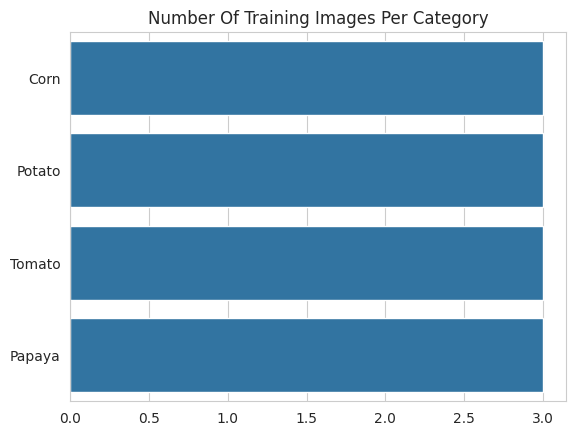

In [ ]:
sns.set_style("whitegrid")
category_names = os.listdir(training_path)
nb_categories = len(category_names)
train_images = []

for category in category_names:
    folder = training_path + "/" + category
    train_images.append(len(os.listdir(folder)))

sns.barplot( x=train_images, y=category_names).set_title("Number Of Training Images Per Category");

**Visualizing the Number of Testing Images per Category**

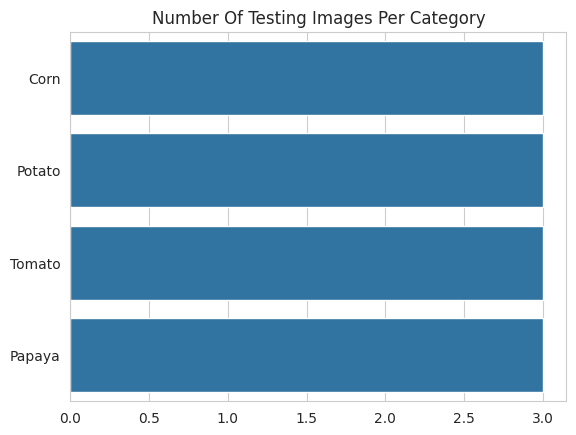

In [ ]:
val_images = []
for category in category_names:
    folder = testing_path + "/" + category
    val_images.append(len(os.listdir(folder)))

sns.barplot(x=train_images, y=category_names).set_title("Number Of Testing Images Per Category");

**Loading and Displaying Training Images with ImageDataGenerator**

Found 3072 images belonging to 4 classes.


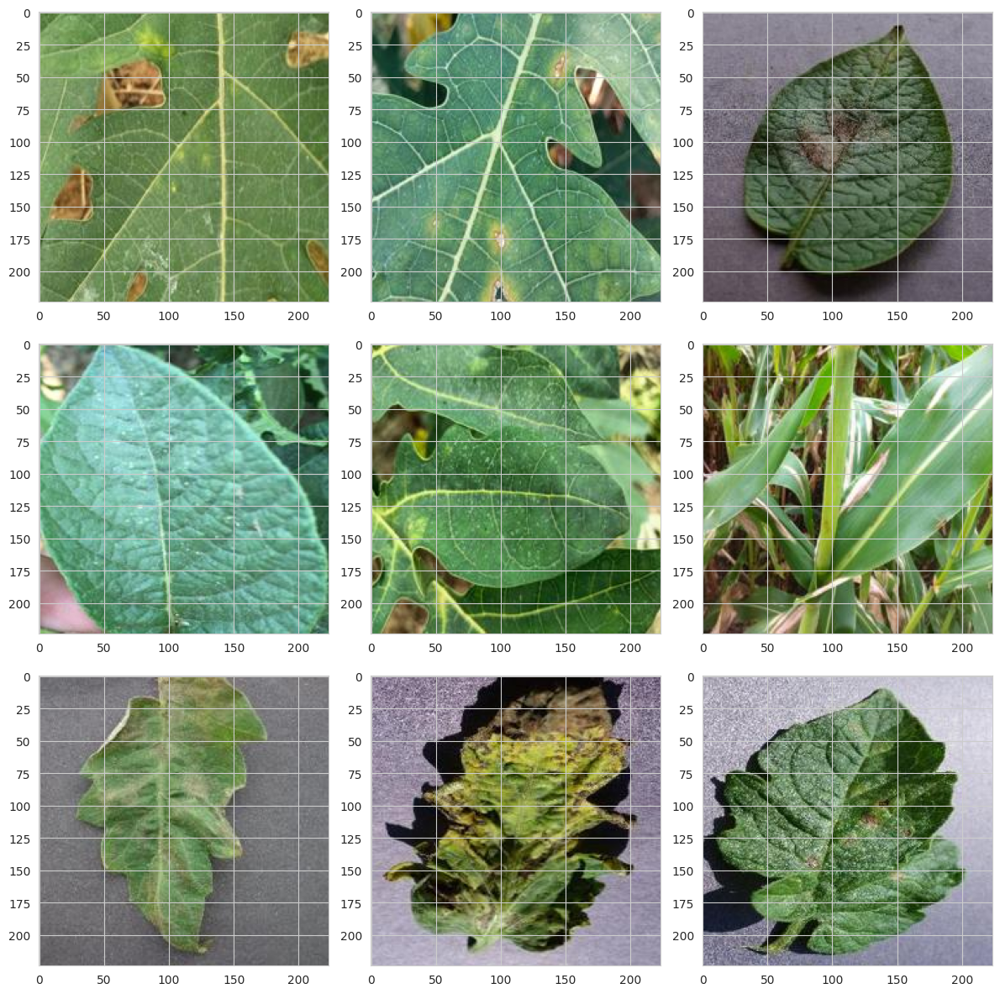

In [ ]:
training_path = '/content/Plant_Disease_Dataset/train'

train_data_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
train_generator = train_data_gen.flow_from_directory(training_path, target_size=(224, 224), class_mode='categorical', subset='training')

plt.figure(figsize=(12, 12))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    for X_batch, Y_batch in train_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

Load and display sample training images from the dataset using `ImageDataGenerator`, helping to visualize the variety of plant diseases in the dataset.

#**4. AUGMENTATION**

**Augmenting Images in Plant Disease Dataset with Data Augmentation Techniques**

In [ ]:
dataset_dir = './Plant_Disease_Dataset/train'
output_dir = './Plant_Disease_Dataset/augmented'

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.05,
    height_shift_range=0.05,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True
)

for plant in os.listdir(dataset_dir):
    plant_path = os.path.join(dataset_dir, plant)
    if os.path.isdir(plant_path):
        for disease in os.listdir(plant_path):
            disease_path = os.path.join(plant_path, disease)
            output_path = os.path.join(output_dir, plant, disease)
            if not os.path.exists(output_path):
                os.makedirs(output_path)
            for img_file in os.listdir(disease_path):
                img_path = os.path.join(disease_path, img_file)
                try:
                    img = load_img(img_path)
                    x = img_to_array(img)
                    x = x.reshape((1,) + x.shape)

                    i = 0
                    for batch in datagen.flow(x, batch_size=1, save_to_dir=output_path, save_prefix='aug', save_format='jpeg'):
                        i += 1
                        if i > 4:
                            break
                except Exception as e:
                    print(f"Error processing {img_file}: {e}")

print("Augmentation process completed!")

Proses augmentasi selesai!


This code enhances the training dataset by generating 4 augmented variations for each original image using techniques like rotation, shift, and flip.

**Renaming Image Files in Plant Disease Dataset to Standard Format**

In [ ]:
def rename_images(dataset_path):
    for plant in os.listdir(dataset_path):
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            for disease in os.listdir(plant_path):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    image_files = [f for f in os.listdir(disease_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]
                    for i, image_file in enumerate(image_files):
                        old_path = os.path.join(disease_path, image_file)
                        new_name = f"{disease}_{i+1}.jpg"
                        new_path = os.path.join(disease_path, new_name)
                        os.rename(old_path, new_path)
                        print(f"Renamed '{image_file}' to '{new_name}'")

dataset_path = '/content/Plant_Disease_Dataset/augmented'
rename_images(dataset_path)

Streaming output truncated to the last 5000 lines.
Renamed 'aug_0_7518.jpeg' to 'Tomato_septoria_leaf_spot_872.jpg'
Renamed 'aug_0_3702.jpeg' to 'Tomato_septoria_leaf_spot_873.jpg'
Renamed 'aug_0_7104.jpeg' to 'Tomato_septoria_leaf_spot_874.jpg'
Renamed 'aug_0_4862.jpeg' to 'Tomato_septoria_leaf_spot_875.jpg'
Renamed 'aug_0_4204.jpeg' to 'Tomato_septoria_leaf_spot_876.jpg'
Renamed 'aug_0_6928.jpeg' to 'Tomato_septoria_leaf_spot_877.jpg'
Renamed 'aug_0_7809.jpeg' to 'Tomato_septoria_leaf_spot_878.jpg'
Renamed 'aug_0_307.jpeg' to 'Tomato_septoria_leaf_spot_879.jpg'
Renamed 'aug_0_3598.jpeg' to 'Tomato_septoria_leaf_spot_880.jpg'
Renamed 'aug_0_4880.jpeg' to 'Tomato_septoria_leaf_spot_881.jpg'
Renamed 'aug_0_7659.jpeg' to 'Tomato_septoria_leaf_spot_882.jpg'
Renamed 'aug_0_3478.jpeg' to 'Tomato_septoria_leaf_spot_883.jpg'
Renamed 'aug_0_4953.jpeg' to 'Tomato_septoria_leaf_spot_884.jpg'
Renamed 'aug_0_7705.jpeg' to 'Tomato_septoria_leaf_spot_885.jpg'
Renamed 'aug_0_4142.jpeg' to 'Tomato_sep

Renames augmented image files in the dataset to a standardized format, ensuring consistency by using a combination of disease name and a unique index number for each image.

**Counting Augmented Images in Plant Disease Dataset**

In [ ]:
augmented_path = '/content/Plant_Disease_Dataset/augmented'
subfolders = []
for folder in folders:
    subfolders.append(os.listdir(os.path.join(augmented_path, folder)))

data = []
for i in range(len(folders)):
    for j in range(len(subfolders[i])):
        count = len(os.listdir(os.path.join(augmented_path, folders[i], subfolders[i][j])))
        data.append({'Plant': folders[i], 'Disease': subfolders[i][j], 'Count': count})


df = pd.DataFrame(data)
pd.set_option('display.max_rows', None)
print(df)

     Plant                        Disease  Count
0     Corn                    Corn_blight   1465
1     Corn            Corn_gray_leaf_spot   1476
2     Corn               Corn_common_rust   1482
3   Papaya           Papaya_BacterialSpot   1456
4   Papaya                    Papaya_Curl   1454
5   Papaya                Papaya_RingSpot   1487
6   Potato   Potato_phytopthora_infestans   1469
7   Potato                   Potato_virus   1480
8   Potato       Potato_alternaria_solani   1475
9   Tomato             Tomato_late_blight   1484
10  Tomato  Tomato_yellow_leaf_curl_virus   1481
11  Tomato      Tomato_septoria_leaf_spot   1474


Counts the augmented images for each plant disease, showing increased image counts after augmentation, with each disease having over 1,400 images.

**Display Sample Image for Each Disease in Plants (Training)**

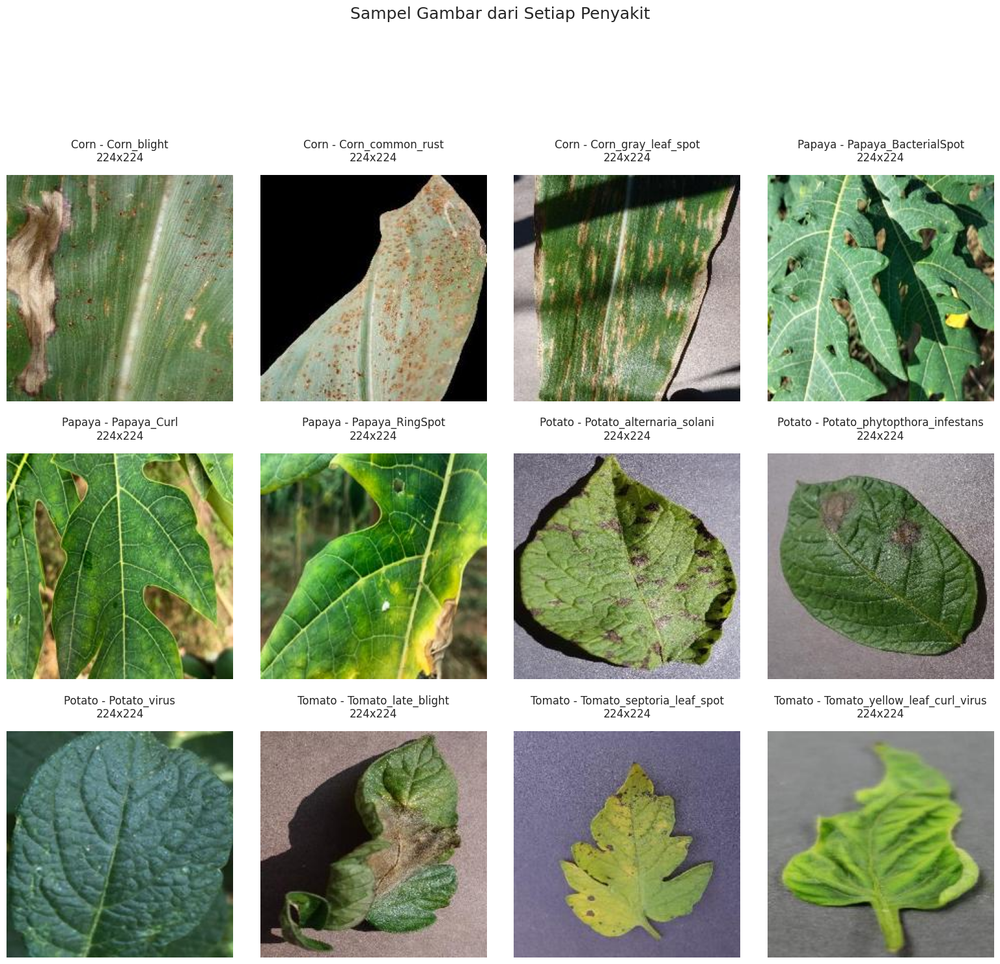

In [ ]:
def display_one_image_per_disease(dataset_path):
    images_info = []
    for plant in sorted(os.listdir(dataset_path)):
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            for disease in sorted(os.listdir(plant_path)):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    files = os.listdir(disease_path)
                    if files:
                        sample_file = files[0]
                        sample_file_path = os.path.join(disease_path, sample_file)
                        images_info.append((plant, disease, sample_file_path))

    num_images = len(images_info)
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 5 * num_rows))
    fig.suptitle('Sample Images from Each Disease', fontsize=18, y=1.02)

    axes = axes.flatten() if num_rows > 1 else axes

    for i, (plant, disease, file_path) in enumerate(images_info):
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(f"{plant} - {disease}\n{width}x{height}", fontsize=12, pad=15)
        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95], pad=3.0)
    plt.show()

reduced_path = '/content/Plant_Disease_Dataset/train'
display_one_image_per_disease(reduced_path)

Displays sample images for each plant disease, providing a visual overview of the training dataset with image sizes included.

**Displaying a Sample Image for Each Disease in the Augmented Dataset**

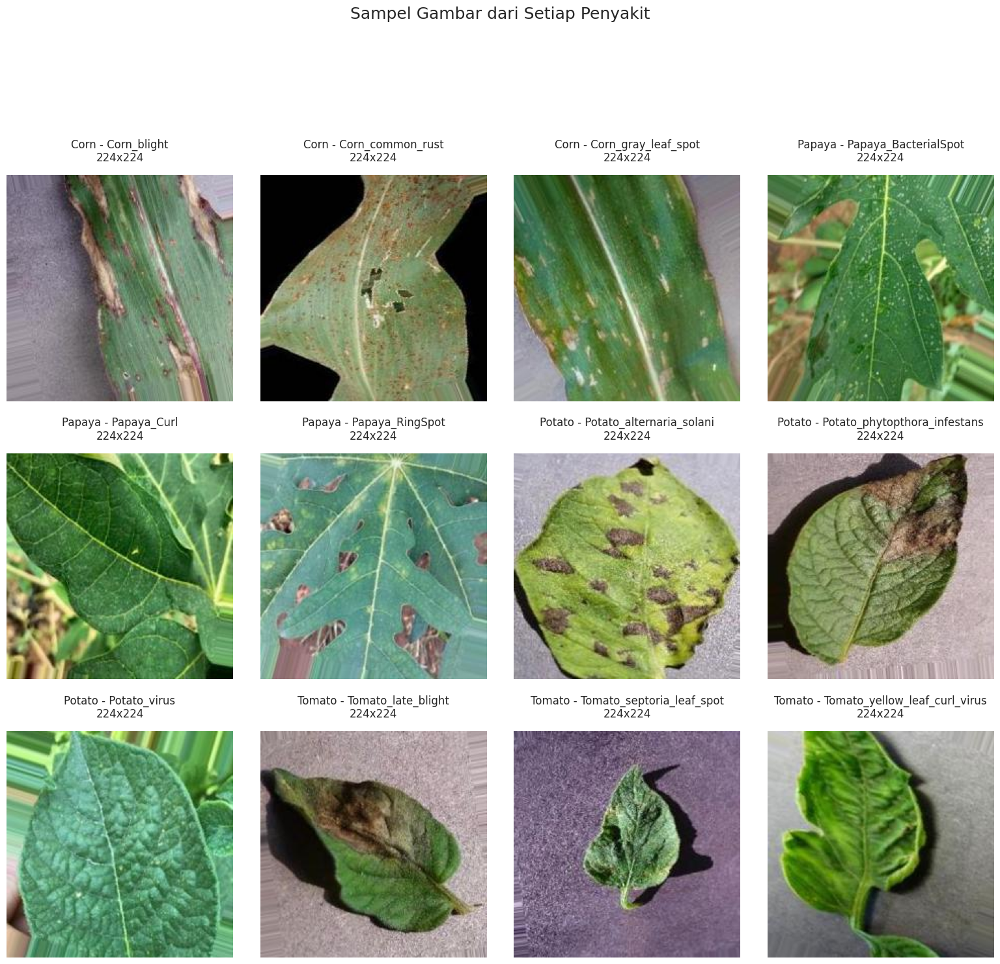

In [ ]:
def display_one_image_per_disease(dataset_path):
    images_info = []
    for plant in sorted(os.listdir(dataset_path)):
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            for disease in sorted(os.listdir(plant_path)):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    files = os.listdir(disease_path)
                    if files:
                        sample_file = files[0]
                        sample_file_path = os.path.join(disease_path, sample_file)
                        images_info.append((plant, disease, sample_file_path))

    num_images = len(images_info)
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 5 * num_rows))
    fig.suptitle('Sample Images from Each Disease', fontsize=18, y=1.02)

    axes = axes.flatten() if num_rows > 1 else axes

    for i, (plant, disease, file_path) in enumerate(images_info):
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(f"{plant} - {disease}\n{width}x{height}", fontsize=12, pad=15)
        except Exception as e:
            print(f"Error processing file {file_path}: {e}")

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95], pad=3.0)
    plt.show()

reduced_path = '/content/Plant_Disease_Dataset/augmented'
display_one_image_per_disease(reduced_path)

Displays sample images for each plant disease, providing a visual overview of the augmented dataset with image sizes included.

**Renaming Subfolders in the Augmented Dataset**

In [ ]:
def rename_subfolders(dataset_path):
    for plant in os.listdir(dataset_path):
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            for disease in os.listdir(plant_path):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    new_folder_name = f"{plant}_{disease}"
                    new_folder_path = os.path.join(dataset_path, new_folder_name)
                    os.rename(disease_path, new_folder_path)
                    print(f"Renamed: {disease_path} -> {new_folder_path}")
            try:
                os.rmdir(plant_path)
                print(f"Removed empty folder: {plant_path}")
            except OSError as e:
                print(f"Could not remove folder: {plant_path}, {e}")

DATASET_PATH = '/content/Plant_Disease_Dataset/augmented'
rename_subfolders(DATASET_PATH)

Renamed: /content/Plant_Disease_Dataset/augmented/Corn/Corn_blight -> /content/Plant_Disease_Dataset/augmented/Corn_Corn_blight
Renamed: /content/Plant_Disease_Dataset/augmented/Corn/Corn_gray_leaf_spot -> /content/Plant_Disease_Dataset/augmented/Corn_Corn_gray_leaf_spot
Renamed: /content/Plant_Disease_Dataset/augmented/Corn/Corn_common_rust -> /content/Plant_Disease_Dataset/augmented/Corn_Corn_common_rust
Removed empty folder: /content/Plant_Disease_Dataset/augmented/Corn
Renamed: /content/Plant_Disease_Dataset/augmented/Potato/Potato_phytopthora_infestans -> /content/Plant_Disease_Dataset/augmented/Potato_Potato_phytopthora_infestans
Renamed: /content/Plant_Disease_Dataset/augmented/Potato/Potato_virus -> /content/Plant_Disease_Dataset/augmented/Potato_Potato_virus
Renamed: /content/Plant_Disease_Dataset/augmented/Potato/Potato_alternaria_solani -> /content/Plant_Disease_Dataset/augmented/Potato_Potato_alternaria_solani
Removed empty folder: /content/Plant_Disease_Dataset/augmented/P

Renames subfolders in the augmented dataset to follow a consistent naming format and removes empty parent folders after renaming.

In [ ]:
def rename_subfolders(dataset_path):
    for plant in os.listdir(dataset_path):
        plant_path = os.path.join(dataset_path, plant)
        if os.path.isdir(plant_path):
            for disease in os.listdir(plant_path):
                disease_path = os.path.join(plant_path, disease)
                if os.path.isdir(disease_path):
                    new_folder_name = f"{plant}_{disease}"
                    new_folder_path = os.path.join(dataset_path, new_folder_name)
                    os.rename(disease_path, new_folder_path)
                    print(f"Renamed: {disease_path} -> {new_folder_path}")

            try:
                os.rmdir(plant_path)
                print(f"Removed empty folder: {plant_path}")
            except OSError as e:
                print(f"Could not remove folder: {plant_path}, {e}")

DATASET_PATH = '/content/Plant_Disease_Dataset/test'
rename_subfolders(DATASET_PATH)

Renamed: /content/Plant_Disease_Dataset/test/Corn/Corn_blight -> /content/Plant_Disease_Dataset/test/Corn_Corn_blight
Renamed: /content/Plant_Disease_Dataset/test/Corn/Corn_gray_leaf_spot -> /content/Plant_Disease_Dataset/test/Corn_Corn_gray_leaf_spot
Renamed: /content/Plant_Disease_Dataset/test/Corn/Corn_common_rust -> /content/Plant_Disease_Dataset/test/Corn_Corn_common_rust
Removed empty folder: /content/Plant_Disease_Dataset/test/Corn
Renamed: /content/Plant_Disease_Dataset/test/Potato/Potato_phytopthora_infestans -> /content/Plant_Disease_Dataset/test/Potato_Potato_phytopthora_infestans
Renamed: /content/Plant_Disease_Dataset/test/Potato/Potato_virus -> /content/Plant_Disease_Dataset/test/Potato_Potato_virus
Renamed: /content/Plant_Disease_Dataset/test/Potato/Potato_alternaria_solani -> /content/Plant_Disease_Dataset/test/Potato_Potato_alternaria_solani
Removed empty folder: /content/Plant_Disease_Dataset/test/Potato
Renamed: /content/Plant_Disease_Dataset/test/Tomato/Tomato_late_

Renames subfolders in the test dataset to follow a consistent naming format and removes empty parent folders after renaming.

**Renaming Folders to Remove Duplicate Prefixes in Dataset Directories**

In [ ]:
def rename_folders_in_directory(base_path):
    for root, dirs, _ in os.walk(base_path):
        for dir_name in dirs:
            new_name = '_'.join(dir_name.split('_')[1:]) if dir_name.count('_') > 1 else dir_name
            if new_name != dir_name:
                old_folder_path = os.path.join(root, dir_name)
                new_folder_path = os.path.join(root, new_name)
                try:
                    os.rename(old_folder_path, new_folder_path)
                    print(f"Renamed '{old_folder_path}' to '{new_folder_path}'")
                except Exception as e:
                    print(f"Error renaming '{old_folder_path}': {e}")

base_path_augmentation = '/content/Plant_Disease_Dataset/augmented'
base_path_test = '/content/Plant_Disease_Dataset/test'

rename_folders_in_directory(base_path_augmentation)
rename_folders_in_directory(base_path_test)

Renamed '/content/Plant_Disease_Dataset/augmented/Tomato_Tomato_septoria_leaf_spot' to '/content/Plant_Disease_Dataset/augmented/Tomato_septoria_leaf_spot'
Renamed '/content/Plant_Disease_Dataset/augmented/Tomato_Tomato_late_blight' to '/content/Plant_Disease_Dataset/augmented/Tomato_late_blight'
Renamed '/content/Plant_Disease_Dataset/augmented/Potato_Potato_virus' to '/content/Plant_Disease_Dataset/augmented/Potato_virus'
Renamed '/content/Plant_Disease_Dataset/augmented/Papaya_Papaya_BacterialSpot' to '/content/Plant_Disease_Dataset/augmented/Papaya_BacterialSpot'
Renamed '/content/Plant_Disease_Dataset/augmented/Potato_Potato_phytopthora_infestans' to '/content/Plant_Disease_Dataset/augmented/Potato_phytopthora_infestans'
Renamed '/content/Plant_Disease_Dataset/augmented/Corn_Corn_blight' to '/content/Plant_Disease_Dataset/augmented/Corn_blight'
Renamed '/content/Plant_Disease_Dataset/augmented/Potato_Potato_alternaria_solani' to '/content/Plant_Disease_Dataset/augmented/Potato_alt

Renames folders in the dataset by removing duplicate prefixes (such as "Tomato_Tomato_septoria_leaf_spot" to "Tomato_septoria_leaf_spot"), streamlining the folder names for consistency.

**Streamlining Folder Names and Counting Images in Test Dataset**

In [ ]:
augmented_path = '/content/Plant_Disease_Dataset/test'
folders = [f for f in os.listdir(augmented_path) if os.path.isdir(os.path.join(augmented_path, f))]

data = []
for folder in folders:
    plant, disease = folder.split('_', 1)
    count = len(os.listdir(os.path.join(augmented_path, folder)))
    data.append({'Plant': plant, 'Disease': disease, 'Count': count})

df = pd.DataFrame(data)
pd.set_option('display.max_rows', None)
print(df)

     Plant                 Disease  Count
0   Tomato             late_blight     80
1   Potato   phytopthora_infestans     80
2     Corn                  blight     80
3   Papaya           BacterialSpot     80
4   Papaya                    Curl     80
5   Tomato  yellow_leaf_curl_virus     80
6   Potato                   virus     80
7     Corn          gray_leaf_spot     80
8     Corn             common_rust     80
9   Papaya                RingSpot     80
10  Potato       alternaria_solani     80
11  Tomato      septoria_leaf_spot     80


Processes the test dataset by splitting folder names into plant and disease categories, then counts the number of images in each folder.


#**5. MODELING**

**Define Dataset Paths and Configuration Parameters for Model Training**

In [ ]:
TRAIN_PATH = "/content/Plant_Disease_Dataset/augmented"
TEST_PATH = "/content/Plant_Disease_Dataset/test"
IMG_SIZE = (224, 224)
BATCH_SIZE = 16
EPOCHS = 40
LEARNING_RATE = 0.0001
TARGET_ACCURACY = 0.98
MODEL_SAVE_PATH = "final_model.keras"

Defines key parameters for training a model on the plant disease dataset, including dataset paths, image size, batch size, number of epochs, learning rate, target accuracy, and the model save path.

**CNN Model Architecture for Plant Disease Classification**

In [ ]:
def create_cnn_model(input_shape, num_classes):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Conv2D(128, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Conv2D(256, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Conv2D(256, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        GlobalAveragePooling2D(),

        Dense(512, activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.5),

        Dense(num_classes, activation='softmax')
    ])

    optimizer = Adam(learning_rate=1e-04)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

Defines a Convolutional Neural Network (CNN) model for plant disease classification, using layers like Conv2D, MaxPooling2D, and BatchNormalization to extract features and reduce overfitting.

**Early Stopping Callback Based on Accuracy for Model Training**

In [ ]:
class EarlyStoppingByAccuracy(Callback):
    def __init__(self, target_accuracy, model_save_path):
        super(EarlyStoppingByAccuracy, self).__init__()
        self.target_accuracy = target_accuracy
        self.model_save_path = model_save_path

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        accuracy = logs.get('accuracy')
        if accuracy is not None and accuracy >= self.target_accuracy:
            print(f"\nTarget accuracy {self.target_accuracy * 100:.2f}% reached at epoch {epoch + 1}.")
            print("Stopping training...")
            self.model.save(self.model_save_path)
            print(f"Model saved to {self.model_save_path}.")
            self.model.stop_training = True

Defines a custom callback, EarlyStoppingByAccuracy, for early stopping during model training. It monitors the model's accuracy and halts training once the target accuracy is reached, saving the model at that point.

**Training and Evaluating CNN Model with Early Stopping and Learning Rate Adjustment**

In [ ]:
def train_model(train_path, test_path, img_size, batch_size, epochs, learning_rate, target_accuracy, model_save_path):
    train_datagen = ImageDataGenerator(rescale=1.0 / 255)
    test_datagen = ImageDataGenerator(rescale=1.0 / 255)

    train_generator = train_datagen.flow_from_directory(
        train_path,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True
    )

    test_generator = test_datagen.flow_from_directory(
        test_path,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    input_shape = (img_size[0], img_size[1], 3)
    model = create_cnn_model(input_shape, train_generator.num_classes)

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    checkpoint = ModelCheckpoint(model_save_path, monitor='val_loss', save_best_only=True, verbose=1)
    early_stopping = EarlyStoppingByAccuracy(target_accuracy=target_accuracy, model_save_path=model_save_path)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)

    history = model.fit(
        train_generator,
        validation_data=test_generator,
        epochs=epochs,
        callbacks=[checkpoint, early_stopping, reduce_lr]
    )

    _, accuracy = model.evaluate(test_generator)
    print(f"Test Accuracy: {accuracy * 100:.2f}%")

    return model, history, train_generator.class_indices

The `train_model` function trains a CNN model with early stopping, learning rate reduction, and model checkpointing. It loads images using data generators, compiles the model, and trains it until the target accuracy is met or the validation loss stops improving. The test accuracy is then evaluated.

**Executing Model Training with Specified Parameters**

In [ ]:
model, history, class_indices = train_model(
    train_path=TRAIN_PATH,
    test_path=TEST_PATH,
    img_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    learning_rate=LEARNING_RATE,
    target_accuracy=TARGET_ACCURACY,
    model_save_path=MODEL_SAVE_PATH
)

Found 17683 images belonging to 12 classes.
Found 960 images belonging to 12 classes.
Epoch 1/40
1105/1106 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.6124 - loss: 1.4539
Epoch 1: val_loss improved from inf to 1.08600, saving model to final_model.keras
1106/1106 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - accuracy: 0.6126 - loss: 1.4533 - val_accuracy: 0.7385 - val_loss: 1.0860 - learning_rate: 1.0000e-04
Epoch 2/40
1105/1106 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.8152 - loss: 0.8119
Epoch 2: val_loss improved from 1.08600 to 0.82266, saving model to final_model.keras
1106/1106 ━━━━━━━━━━━━━━━━━━━━ 69s 37ms/step - accuracy: 0.8152 - loss: 0.8118 - val_accuracy: 0.8021 - val_loss: 0.8227 - learning_rate: 1.0000e-04
Epoch 3/40
1106/1106 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.8522 - loss: 0.6796
Epoch 3: val_loss improved from 0.82266 to 0.78559, saving model to final_model.keras
1106/1106 ━━━━━━━━━━━━━━━━━━━━ 43s 38ms/step - accuracy: 0.8522 - loss: 0.6796 - val_accuracy: 

The model training successfully reached the target accuracy of 98% by epoch 15, triggering early stopping. The model was saved after reaching the target accuracy. During training, the validation loss and accuracy improved, with the final test accuracy being 85%.

**Plotting Model Accuracy and Loss Curves**

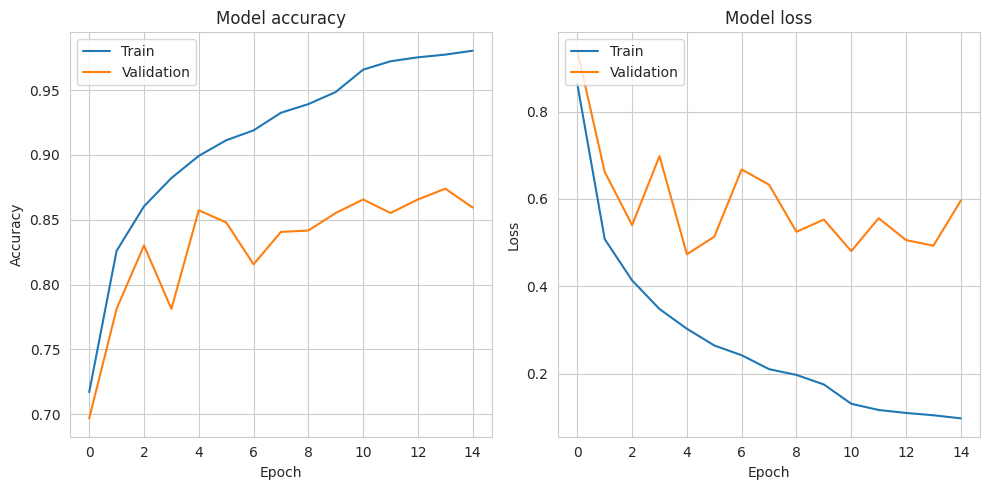

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.tight_layout()
plt.show()

We can see two plots: one plot shows the accuracy of the model over some time for training and validation, and the other plot shows the loss over the same period. These plots help assess the model's performance and identify overfitting or underfitting trends.

**Saving the Model Architecture as an Image**

In [ ]:
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

**Displaying the Model Summary**

In [ ]:
model.summary()

The model.summary() function displays a summary of the model, including details about each layer, its output shape, and the number of parameters, offering a quick overview of the model's architecture.

**Function to Plot Training and Validation Accuracy and Loss**

In [ ]:
def plot_training_history(history):
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    ax1.plot(range(1, len(train_acc) + 1), train_acc, label='Training Accuracy', color='blue')
    ax1.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy', color='orange')
    ax1.set_title('Accuracy during Training')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.legend()

    ax2.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss', color='blue')
    ax2.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss', color='orange')
    ax2.set_title('Loss during Training')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
plot_training_history(history)

This function plots the training and validation accuracy on one graph, and the training and validation loss on another, using data from the model's training history. It helps visualize the model's performance over epochs.

**Function to Retrieve Class Indices from Dataset Directory**

In [ ]:
def get_class_indices(base_path):
    subfolders = [os.path.join(root, d) for root, dirs, _ in os.walk(base_path) for d in dirs]
    labels = [os.path.relpath(folder, base_path).replace("\\", "/") for folder in subfolders]
    return {label: idx for idx, label in enumerate(sorted(labels))}

class_indices = get_class_indices(TRAIN_PATH)
print(f"Class Indices Mapping: {class_indices}")

Generates a dictionary mapping class labels (subfolders) to unique indices, useful for classifying images during model training.

**Image Prediction for Plant Disease Detection**

In [ ]:
class_indices = {'Corn_blight': 0, 'Corn_common_rust': 1, 'Corn_gray_leaf_spot': 2, 'Papaya_BacterialSpot': 3, 'Papaya_Curl': 4, 'Papaya_RingSpot': 5, 'Potato_alternaria_solani': 6, 'Potato_phytopthora_infestans': 7, 'Potato_virus': 8, 'Tomato_late_blight': 9, 'Tomato_septoria_leaf_spot': 10, 'Tomato_yellow_leaf_curl_virus': 11}

def predict_image(model_path, image_path, img_size, class_indices):
    model = load_model(model_path)

    img = load_img(image_path, target_size=img_size)
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions, axis=1)[0]

    class_labels = {v: k for k, v in class_indices.items()}
    full_label = class_labels.get(predicted_class, "Unknown")

    if '_' in full_label:
        nama_tanaman, penyakit_tanaman = full_label.split('_', 1)
    else:
        nama_tanaman, penyakit_tanaman = full_label, "Tidak diketahui"

    confidence_score = predictions[0][predicted_class] * 100

    return nama_tanaman, penyakit_tanaman, confidence_score

model_path = 'final_model.keras'
image_path = '/content/test_potato_phytopthora_infestans.jpeg'
img_size = (224, 224)

nama_tanaman, penyakit_tanaman, confidence_score = predict_image(model_path, image_path, img_size, class_indices)

print(f"Nama Tanaman: {nama_tanaman}")
print(f"Penyakit Tanaman: {penyakit_tanaman}")
print(f"Hasil Prediksi: {confidence_score:.2f}%")

Predicts the plant disease from an image using a trained model. It processes the image, makes a prediction, and returns the plant name, disease, and the confidence score. The `class_indices` dictionary maps class labels to integer values, which the model uses for classification.

**Saving the Trained Model to HDF5 Format**

In [ ]:
model = tf.keras.models.load_model('final_model.keras')
model.save('model_89_38_newdataset.h5')

Saves the trained model in HDF5 format (.h5), preserving its architecture, weights, and configuration.

**Saving the Trained Model, Training History, and Plot**

In [ ]:
output_dir = "/content/Train model"
os.makedirs(output_dir, exist_ok=True)

model.save(os.path.join(output_dir, "Model 5 dec.h5"))

with open(os.path.join(output_dir, "training_history.txt"), "w") as f:
  f.write(str(history.history))

plt.savefig(os.path.join(output_dir, "training_plot.png"))
print(f"Model, training history, and plot saved to: {output_dir}")

The code saves the trained model, its training history, and performance plot to a specified directory.

**Zipping and Downloading Folder Contents in Google Colab**

In [ ]:
def zip_and_download_folder(folder_path, zip_filename):
  try:
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
      for root, _, files in os.walk(folder_path):
        for file in files:
          zipf.write(os.path.join(root, file),
                     os.path.relpath(os.path.join(root, file),
                                     os.path.join(folder_path, '..')))

    from google.colab import files
    files.download(zip_filename)
    print(f"Successfully zipped and downloaded '{zip_filename}'.")

  except FileNotFoundError:
    print(f"Error: Folder '{folder_path}' not found.")
  except Exception as e:
    print(f"An error occurred: {e}")

zip_and_download_folder("/content/Train model", "train_model.zip")

The function zips a specified folder and its contents, preserving the directory structure, and then triggers a download of the zip file. It includes error handling for missing folders or other issues during the process.